In [32]:
!pip install prophet


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip


In [33]:
import pandas as pd
from prophet import Prophet
import datetime
from itertools import cycle

import seaborn as sn
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [34]:
df_BTC = pd.read_csv('final_BTCUSDT_20230619.csv')
df_BTC.head()

,open_time,close_time,open,high,low,close,volume,quote_asset_volume,num_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,open_timestamp,close_timestamp,symbol,currency
0,"12/31/2021, 23:00:00","12/31/2021, 23:59:59",46303.98,46520.13,46132.04,46216.93,985.99762,4.571976e+07,29555,484.09229,2.244919e+07,0,1640991600000,1640995199999,BTC,USDT
1,"12/31/2021, 22:00:00","12/31/2021, 22:59:59",46333.87,46569.97,46232.36,46303.99,991.85142,4.600406e+07,36280,447.96605,2.077702e+07,0,1640988000000,1640991599999,BTC,USDT
2,"12/31/2021, 21:00:00","12/31/2021, 21:59:59",45886.66,46513.67,45766.85,46333.86,1734.69585,7.997065e+07,54579,972.44065,4.482430e+07,0,1640984400000,1640987999999,BTC,USDT
3,"12/31/2021, 20:00:00","12/31/2021, 20:59:59",45728.28,46211.07,45678.00,45879.24,1831.41202,8.422142e+07,51300,997.72369,4.588270e+07,0,1640980800000,1640984399999,BTC,USDT
4,"12/31/2021, 19:00:00","12/31/2021, 19:59:59",46686.42,46688.68,45678.96,45728.28,3851.30902,1.776171e+08,87472,1691.64542,7.803749e+07,0,1640977200000,1640980799999,BTC,USDT


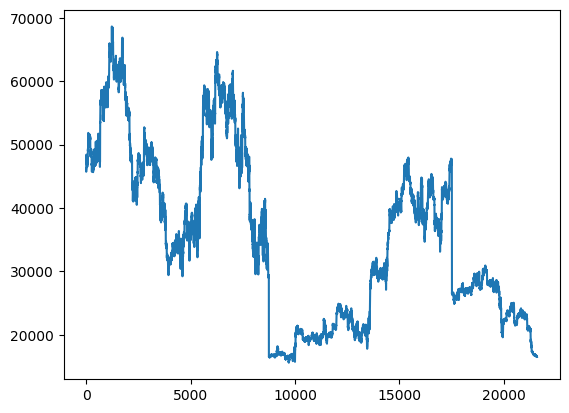

In [35]:
df_BTC['close'].plot.line()
plt.show()

In [36]:
len(df_BTC)

21586

In [37]:
weekday_dict = {0: "Monday", 1: "Tuesday", 2: "Wednesday", 3: "Thursday", 4: "Friday", 5: "Saturday", 6: "Sunday"}

In [38]:
df_BTC['close_datetime'] = pd.to_datetime(df_BTC['close_time'])

In [39]:
df_BTC['weekday'] = df_BTC['close_datetime'].apply(lambda x: weekday_dict[x.weekday()])

In [40]:
y = pd.get_dummies(df_BTC.weekday, prefix='Day')

In [41]:
df_BTC = df_BTC.join(y, how = 'left').drop('weekday', axis=1)

In [42]:
df_BTC = df_BTC.sort_values(by = ['close_datetime']).reset_index(drop=True)

In [43]:
### Model Training and Calibration

In [44]:
df_BTC_fbp = df_BTC[['Day_Monday', 'Day_Tuesday', 'Day_Wednesday', 'Day_Thursday', 'Day_Friday', 'Day_Saturday', 'Day_Sunday', 'close_datetime', 'close']].rename(columns={"close_datetime": "ds", "close": "y"})

In [45]:
df_BTC_fbp = df_BTC_fbp.sort_values("ds")

In [46]:
# df_BTC_train = df_BTC_fbp[df_BTC_fbp['ds'] < df_BTC_fbp.ds.max() - datetime.timedelta(days = 60)]
# df_BTC_test = df_BTC_fbp[df_BTC_fbp['ds'] >= df_BTC_fbp.ds.max() - datetime.timedelta(days = 60)]

In [47]:
pro_regressor = (Prophet(n_changepoints=200,
#                                     daily_seasonality=True,
#                                     weekly_seasonality=True,
#                                     seasonality_mode='additive',
#                                     interval_width=0.2,
#                                     yearly_seasonality= 65,
                                    growth = 'linear'
#                                      ).add_seasonality(name='daily', period=365.5,
#                                                        fourier_order=15
#                                                       )
#                                      .add_seasonality(name='monthly',
#                                                      period=30.5,
#                                                      fourier_order=5)
                ))


In [48]:
        pro_regressor.add_regressor('Day_Monday')
        pro_regressor.add_regressor('Day_Tuesday')
        pro_regressor.add_regressor('Day_Wednesday')
        pro_regressor.add_regressor('Day_Thursday')
        pro_regressor.add_regressor('Day_Friday')
        pro_regressor.add_regressor('Day_Saturday')
        pro_regressor.add_regressor('Day_Sunday')

In [49]:
pro_regressor.fit(df_BTC_fbp)

11:00:44 - cmdstanpy - INFO - Chain [1] start processing
11:03:50 - cmdstanpy - INFO - Chain [1] done processing


In [50]:
future_periods = 30*24
future = pro_regressor.make_future_dataframe(periods=future_periods, freq='H')
future.tail()

,ds
22301,2023-07-19 19:59:59
22302,2023-07-19 20:59:59
22303,2023-07-19 21:59:59
22304,2023-07-19 22:59:59
22305,2023-07-19 23:59:59


In [51]:
future['weekday'] = future['ds'].apply(lambda x: weekday_dict[x.weekday()])

In [52]:
y = pd.get_dummies(future.weekday, prefix='Day')

In [53]:
future = future.join(y, how = 'left').drop('weekday', axis=1)

In [54]:
forecast = pro_regressor.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail().rename(columns = {"ds": "close_datetime"})

,close_datetime,yhat,yhat_lower,yhat_upper
22301,2023-07-19 19:59:59,25768.065030,20435.610538,31195.440602
22302,2023-07-19 20:59:59,25782.161061,20576.914622,30974.849734
22303,2023-07-19 21:59:59,25799.338222,20383.840642,31187.654170
22304,2023-07-19 22:59:59,25818.438003,20609.853621,31093.926193
22305,2023-07-19 23:59:59,25834.620063,20398.432494,31323.494160


In [55]:
df_BTC_full = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].rename(columns = {"ds": "close_datetime"}).merge(df_BTC, how = 'outer', on = 'close_datetime')

In [56]:
df_BTC_full = df_BTC_full.sort_values('close_datetime')
df_BTC_full.tail()

,close_datetime,yhat,yhat_lower,yhat_upper,open_time,close_time,open,high,low,close,...,close_timestamp,symbol,currency,Day_Friday,Day_Monday,Day_Saturday,Day_Sunday,Day_Thursday,Day_Tuesday,Day_Wednesday
22301,2023-07-19 19:59:59,25768.065030,20435.610538,31195.440602,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22302,2023-07-19 20:59:59,25782.161061,20576.914622,30974.849734,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22303,2023-07-19 21:59:59,25799.338222,20383.840642,31187.654170,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22304,2023-07-19 22:59:59,25818.438003,20609.853621,31093.926193,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22305,2023-07-19 23:59:59,25834.620063,20398.432494,31323.494160,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
names = cycle(['Historical close price', 'Predicted close price - 30 days/720 hours'])

fig = px.line(df_BTC_full, x=df_BTC_full.close_datetime, y=[df_BTC_full['close'], df_BTC_full['yhat']],
              labels={'close': 'Stock close price','close_datetime': 'Timestamp'})
fig.update_layout(title_text='BTC Historical v Forecasts (Recent)',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

In [58]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(pro_regressor, forecast)